# Τεχνικές Εξόρυξης Δεδομένων

# Μέρος 1ο: Data exploration

### Σημείωση: για να ανοίξουμε το αρχείο train.csv, πρέπει πρώτα να τρέξουμε το 'generate_train.ipynb', το οποίο το δημιουργεί.

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import nltk
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins


train_df = pd.read_csv("train.csv")
train_df.head()

,id,name,description,transit,host_since,host_response_rate,host_has_profile_pic,host_identity_verified,neighbourhood,city,...,price,minimum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,instant_bookable,cancellation_policy,month
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",Athens Furnished Apartment No6 is 3-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,73.0,1,222,19,2011-05-20,2019-04-08,97.0,t,strict_14_with_grace_period,april
1,10988,"75m2, 2-br, metro, wi-fi, cable TV",Athens Furnished Apartment No4 is 2-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,82.0,1,0,31,2012-10-21,2017-11-23,92.0,t,strict_14_with_grace_period,april
2,10990,"50m2, Metro, WI-FI, cableTV, more",Athens Furnished Apartment No3 is 1-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,1,234,29,2012-09-06,2019-03-03,97.0,t,strict_14_with_grace_period,april
3,10993,"Studio, metro, cable tv, wi-fi, etc",The Studio is an -excellent located -close t...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,38.0,1,226,45,2012-09-24,2019-04-04,96.0,t,strict_14_with_grace_period,april
4,10995,"47m2, close to metro,cable TV,wi-fi",AQA No2 is 1-bedroom apartment (47m2) -excell...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,2,249,17,2010-07-08,2019-04-04,95.0,t,strict_14_with_grace_period,april


## Ερώτημα 1.1: Συχνότερος τύπος δωματίου(room_type)

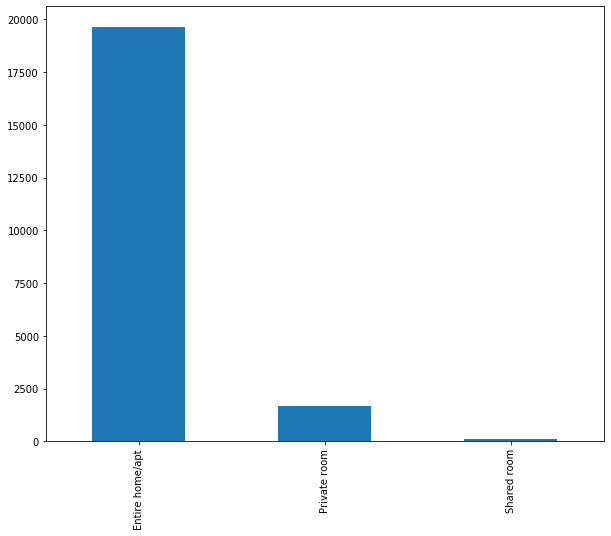

In [2]:
train_df['room_type'].value_counts().plot.bar(figsize=(10,8))

## Ερώτημα 1.2: πορεία τιμών για το διάστημα των μηνών Φεβρουαρίου, Μαρτίου, Απριλίου

Διαβάζουμε το αρχείο calendar.csv από τον μήνα Φεβρουάριο.

In [3]:


feb_cal = pd.read_csv(os.getcwd()+'/data/february/calendar.csv', usecols=['listing_id','date','price'])
feb_cal = feb_cal.dropna()

Φτιάχνουμε την μορφή της στήλης 'prices'.

In [4]:
""" Replace dolar sign on prices and convert them to float type. """
feb_cal['price'] = [x.replace('$', '') for x in feb_cal['price']]
feb_cal.price = [x.replace(',', '') for x in feb_cal.price]
feb_cal['price'] = pd.to_numeric(feb_cal['price'])
feb_cal.head()

,listing_id,date,price
0,571492,2019-02-08,264.0
1,571492,2019-02-09,264.0
2,571492,2019-02-10,264.0
3,571492,2019-02-11,264.0
4,571492,2019-02-12,264.0


Αλλάζουμε τη μορφή των ημερομηνιών.

In [5]:
feb_cal['date']= pd.to_datetime(feb_cal['date'])

Κάνουμε filtering στις ημερομηνίες, για να πάρουμε το διάστημα από αρχές Φεβρουαρίου μέχρι το τέλος του Απρίλη.

In [6]:
start_date = pd.to_datetime('2019-2-8')
end_date = pd.to_datetime('2019-4-30')

filtered = feb_cal[(feb_cal['date'] >= start_date) & (feb_cal['date'] <= end_date)]

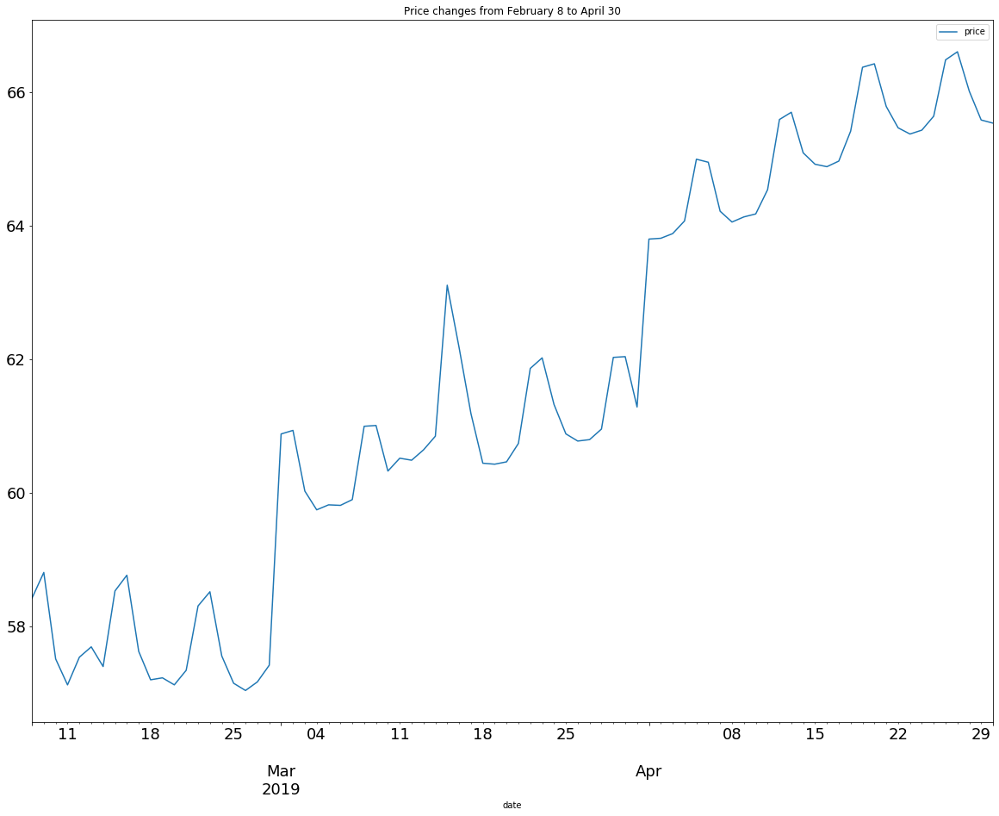

In [7]:
price_course = filtered.groupby("date").agg({"price" : np.mean})
price_course.plot(title = 'Price changes from February 8 to April 30',
                  figsize=(20,15),
                  fontsize=18)

## Ερώτημα 1.3: 5 πρώτες γειτονιές με τις περισσότερες κριτικές


The five most reviewed neighbourhoods are:


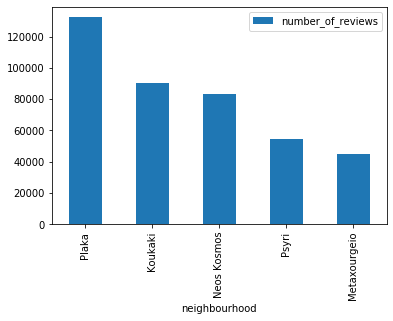

In [8]:
print("The five most reviewed neighbourhoods are:")
df = train_df.groupby("neighbourhood").agg({"number_of_reviews" : sum}).sort_values(by = "number_of_reviews", ascending = False)
df.head(5).plot.bar()

## Ερώτημα 1.4: Γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων

In [9]:
print("The neighbourhood with the most estate logs is",train_df['neighbourhood'].value_counts().idxmax())

The neighbourhood with the most estate logs is Plaka


## Ερώτημα 1.5: Αριθμός καταχωρήσεων ανά γειτονιά και ανά μήνα

Παρατηρούμε από το heatmap ότι η περιοχή με τα περισσότερα ενοικιαζόμενα είναι η Πλάκα.


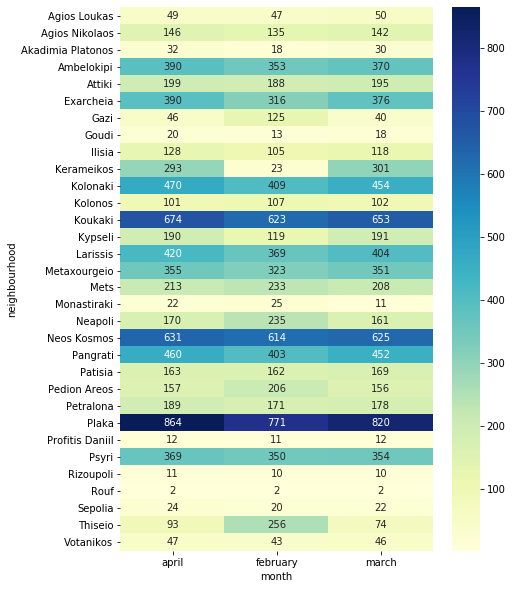

In [10]:
dataset = train_df.groupby(["neighbourhood","month"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='month', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')
print("Παρατηρούμε από το heatmap ότι η περιοχή με τα περισσότερα ενοικιαζόμενα είναι η Πλάκα.")

## Ερώτημα 1.6: Ιστόγραμμα της στήλης "neighbourhood"

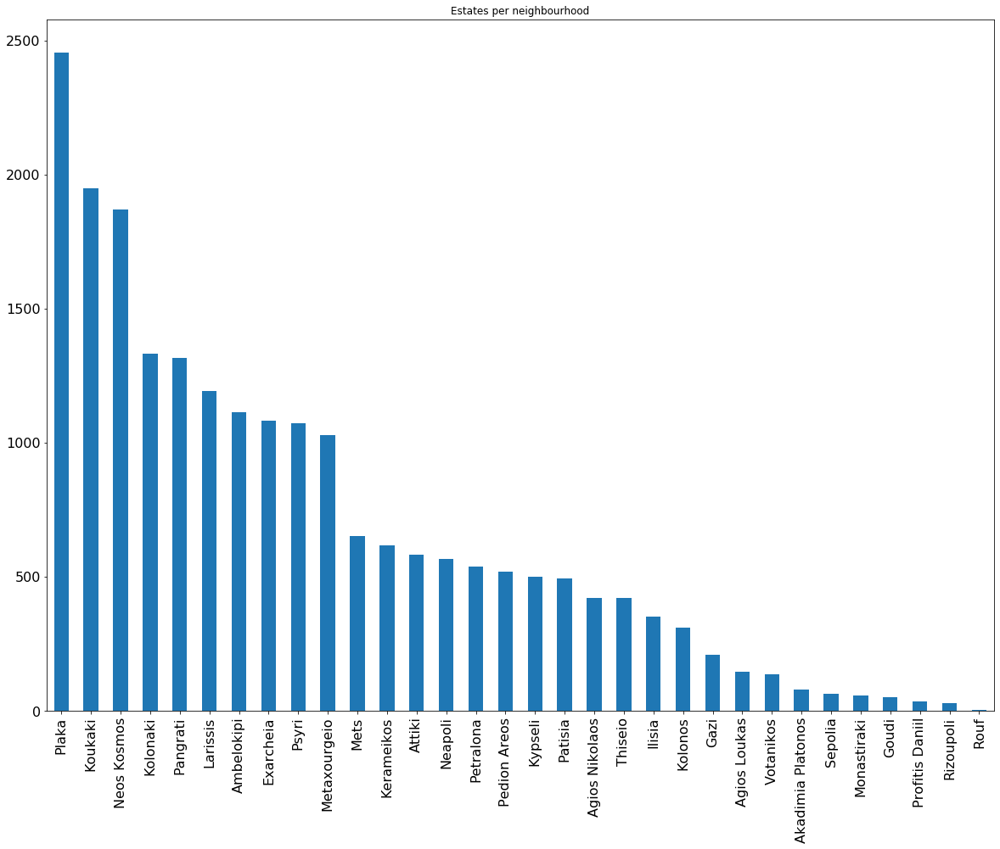

In [11]:
neigh_hgram = train_df.neighbourhood.value_counts()
neigh_hgram.plot.bar(title = 'Estates per neighbourhood',
                  figsize=(20,15),
                  fontsize=16)

## Ερώτημα 1.7: Συχνότερος τύπος δωματίου(room_type) ανά γειτονιά(neighbourhood)

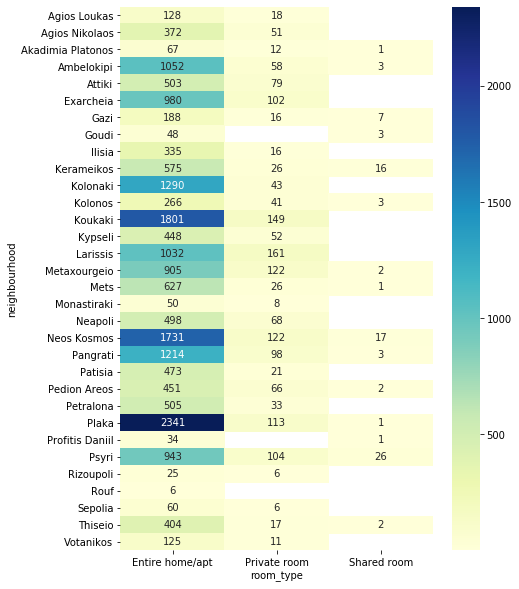

In [12]:
# print("Most common room type for every neighbourhood is:")
# train_df.groupby("neighbourhood")['room_type'].agg(lambda x:x.value_counts().index[0])
dataset = train_df.groupby(["neighbourhood","room_type"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='room_type', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')

## Ερώτημα 1.8: Ακριβότερος τύπος δωματίου(room_type)


In [13]:
print("Most expensive room type is:")
train_df[train_df['price'] == train_df['price'].max()].room_type.head(1)

Most expensive room type is:


13311    Entire home/apt
Name: room_type, dtype: object

## Ερώτημα 1.9: Χάρτης ακινήτων τύπου cluster για το μήνα Απρίλιο

In [14]:

athens_in_april = folium.Map(location=[37.984338, 23.727009], zoom_start=13)

mac = plugins.MarkerCluster().add_to(athens_in_april)

april_df = train_df[train_df['month']=='april']
for i, v in april_df.iterrows():
    popup = """
                Location id: <b>%s</b><br>
                Room type: <b>%s</b><br>
                Bed_type: <b>%s</b><br>
                Neighbourhood: <b>%s</b><br>
                Price: <b>%s</b><br>
    """% (v["id"],v["room_type"],v["bed_type"],v["neighbourhood"],v["price"])
    
    if v['room_type'] == 'Entire home/apt':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#FFBA00',
                            fill_color='#FFBA00',
                            fill=True).add_to(mac)
    elif v['room_type'] == 'Private room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#087FBF',
                            fill_color='#087FBF',
                            fill=True).add_to(mac)
    elif v['room_type'] == 'Shared room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#FF0700',
                            fill_color='#FF0700',
                            fill=True).add_to(mac)
athens_in_april

## Ερώτημα 1.10: Δημιουργία word cloud από τις στήλες neighbourhood, transit, description και last_review

### Neighbourhood word cloud

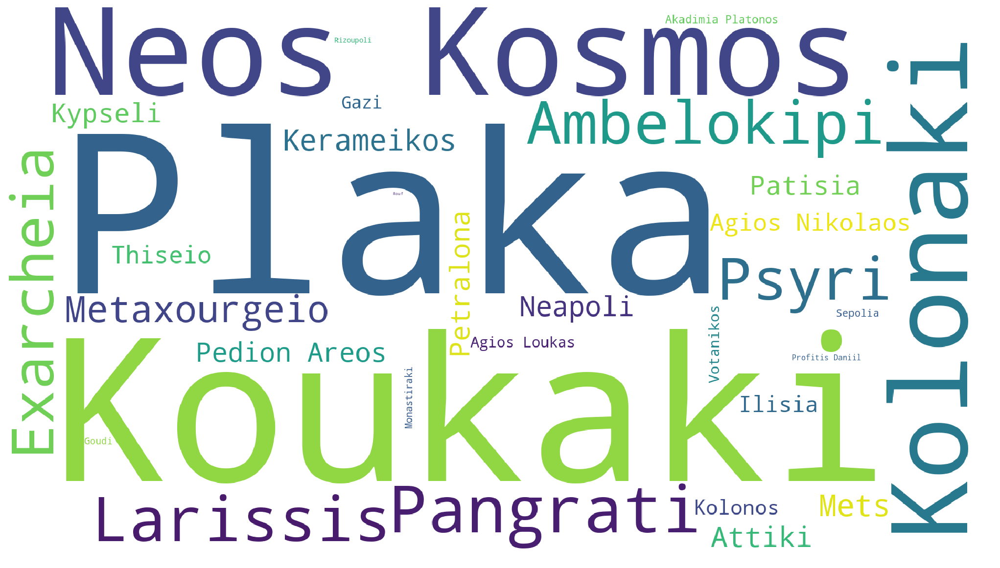

In [15]:
neighbourhood_df = train_df[train_df['neighbourhood'].notna()]['neighbourhood']
neigh_freq = tuple([tuple(x) for x in neighbourhood_df.value_counts().reset_index().values])
wordcloud = WordCloud(width=1920, height=1080, background_color='white').generate_from_frequencies(dict(neigh_freq))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Transit word cloud

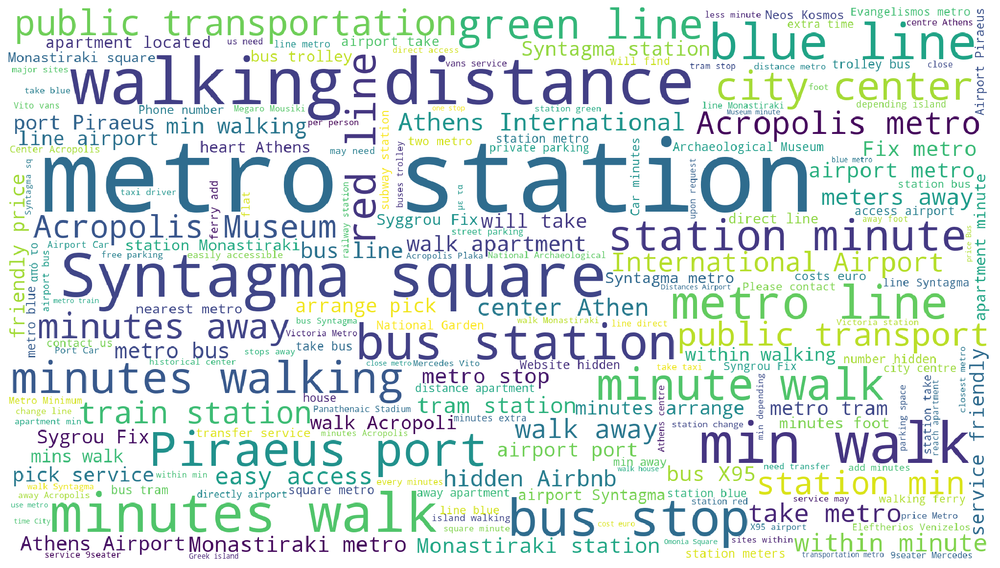

In [16]:
neighbourhood_df = train_df[train_df['transit'].notna()]['transit']
neigh_freq = tuple([tuple(x) for x in neighbourhood_df.value_counts().reset_index().values])
wordcloud2 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(neighbourhood_df))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud2)
plt.axis("off")
plt.show()

### Description word cloud

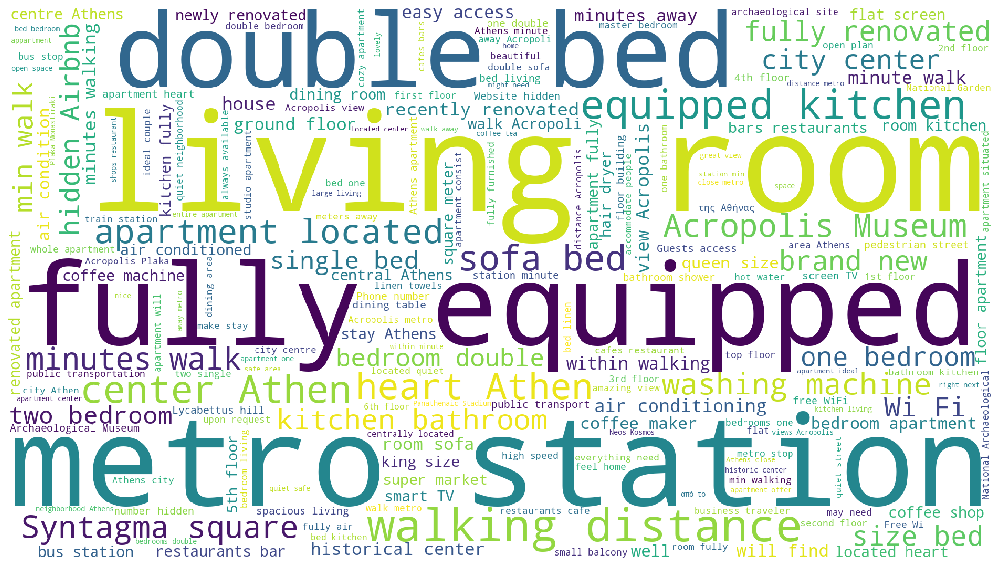

In [17]:
description_df = train_df[train_df['description'].notna()]['description']
wordcloud3 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(description_df))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud3)
plt.axis("off")
plt.show()

### Last_reviews word cloud

In [18]:
df = train_df[train_df['month']=='february']
df = df[['id','last_review']]


reviews_df = pd.read_csv(os.getcwd()+"/data/february/reviews.csv")
reviews_df = reviews_df[reviews_df['comments'].notnull()]
reviews_df = reviews_df[['listing_id','date','comments']]

In [19]:
df = df.merge(reviews_df,left_on=['id','last_review'],right_on=['listing_id','date'])

In [20]:
reviews = df['comments']

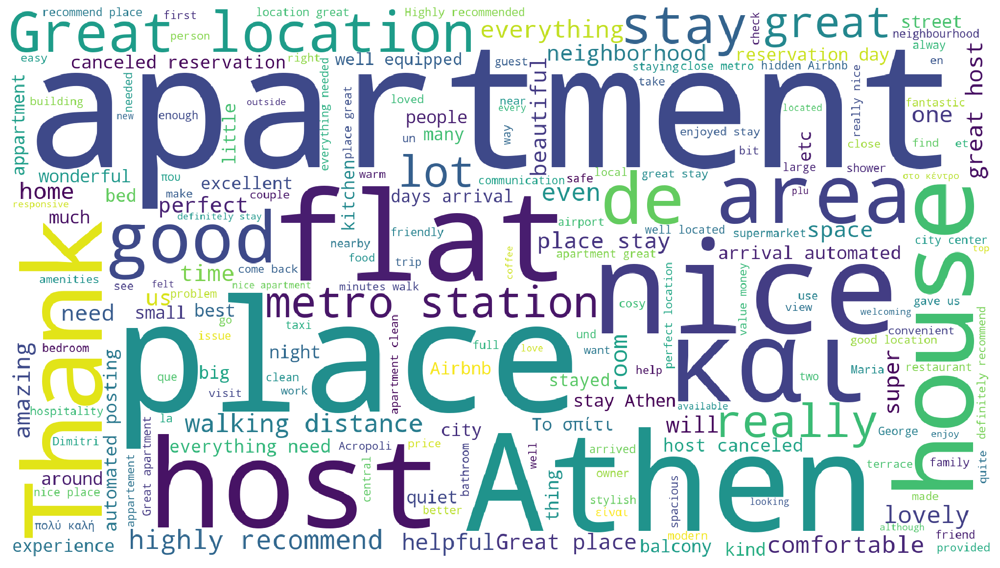

In [21]:
wordcloud4 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(reviews))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud4)
plt.axis("off")
plt.show()

## Ερώτημα 1.11: Το συνολικό πλήθος ακινήτων με την ύψιστη κριτική,    με τιμή ανάμεσα σε 30-50 Ευρώ

In [22]:
price_filtered_df = train_df.loc[(train_df['price'] >= 30) &
                                 (train_df['price'] <= 50) &
                                 (train_df['review_scores_rating'] == 100)]
print("Total estates with perfect rating:",price_filtered_df.price.count())

Total estates with perfect rating: 2636


## Ερώτημα 1.12: Το πιο ακριβό ακίνητο στη γειτονιά με το μικρότερο πλήθος ακινήτων.

In [23]:
min = train_df['neighbourhood'].value_counts().idxmin()
df = train_df[['neighbourhood','price']]
df.loc[(df.neighbourhood == min)].sort_values(by = 'price', ascending = False).head(1)

,neighbourhood,price
13310,Rouf,55.0


# Μέρος 2ο: Recommendation System

In [20]:
rec_df = train_df[['id','name','description']]
rec_df = rec_df.where(pd.notnull(rec_df), "")

## Description wordcloud χωρίς τα stopwords.

In [25]:
description = rec_df['description']
wordcloud3 = WordCloud(width=1920, height=1080, background_color='black',stopwords=STOPWORDS).generate(' '.join(description))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud3)
plt.axis("off")
plt.show()

NameError: name 'summary' is not defined

Κάνουμε συνένωση των στηλών 'name' και 'description', αντικαθιστώντας τις NaN τιμές με τη κενή συμβολοσειρά.

In [21]:
rec_df['summary'] = rec_df['name']+rec_df['description']

## Ερώτημα 3.1

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS as stops

vectorizer = TfidfVectorizer(ngram_range=(1,2), stop_words=stops)

words = rec_df['summary']

X = vectorizer.fit_transform(words)

idf_values = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))

print(X)

  (0, 97402)	0.0803932018514431
  (0, 164739)	0.0803932018514431
  (0, 111396)	0.07805339599665219
  (0, 42053)	0.07805339599665219
  (0, 86656)	0.07892487196782481
  (0, 85628)	0.06550615375787296
  (0, 91418)	0.0688761437445508
  (0, 141880)	0.07805339599665219
  (0, 48339)	0.07892487196782481
  (0, 109420)	0.07764453696521789
  (0, 121504)	0.07892487196782481
  (0, 201496)	0.07549005550603691
  (0, 41480)	0.09599904146942066
  (0, 6304)	0.07486387315260899
  (0, 41162)	0.08276079040210343
  (0, 181795)	0.08076502320393412
  (0, 40623)	0.09960081304811103
  (0, 5065)	0.06921569000497081
  (0, 39222)	0.07987946588854294
  (0, 73910)	0.02449662233934858
  (0, 40321)	0.035213987301906155
  (0, 2973)	0.07847965843027363
  (0, 141712)	0.09599904146942066
  (0, 146094)	0.09599904146942066
  (0, 39325)	0.05613992126832887
  :	:
  (21399, 137546)	0.03202679013170422
  (21399, 217323)	0.07107862165863782
  (21399, 49716)	0.0223570415568539
  (21399, 214635)	0.027755764906269364
  (21399, 1958